# TiVo Segmentation

### How to segment market?
- What do people want?
    - what features do they care about?
    - how much storage do they need?
- How can I reach them?
    - can I communicate with them specifically?
- How should it be priced?
    - will early adopters spend a lot of money on it? what about late adopters?
    - monthly fee vs lifetime fee?
    - long term major rev source: data 
    - price for a model: 500

### Qs that might have been interesting
- Their values/ identity
- How they interact with TV service
    - When they watch
    - Who they watch with
    - What type of things do they watch
- Problems they currently have w TV service
    - weird, they complained about timing and interruptions w tv but most people valued recording to watch w family?
- How they feel about each feature
    - timing control
    - play and record
    - option to skip commercial
    - open access to programs
    - search for and record shows
    - auto record shows
    - recommendations for shows
- How much they'd be willing to pay for the product

In [64]:
# import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
from pandas.io.json import json_normalize
from datetime import datetime
from sklearn import preprocessing

In [65]:
# import and check data
df = pd.read_csv("TiVoData.csv")
df = df.drop(df.index[len(df)-1])
df = df.drop(df.index[len(df)-1])
df = df.drop(df.index[len(df)-1])
df.head()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,male,married,professional,none,49.0,30.0,Florida,family,mass-consumer electronics,35.0,150.0,13.0,late,2.0,saving favorite shows to watch as a family
1,2.0,male,single,none,none,46.0,36.0,Alabama,single,mass-consumer electronics,35.0,163.0,26.0,late,10.0,saving favorite shows to watch as a family
2,3.0,male,married,professional,BA,58.0,66.0,Massachusetts,family,specialty stores,64.0,103.0,13.0,early,0.0,time shifting
3,4.0,male,married,none,PhD,51.0,78.0,New York,family,mass-consumer electronics,33.0,154.0,22.0,late,5.0,saving favorite shows to watch as a family
4,5.0,female,single,none,none,46.0,52.0,Montana,single,mass-consumer electronics,45.0,161.0,47.0,late,2.0,saving favorite shows to watch as a family


In [67]:
# convert string factors to type: category

dfE = pd.read_csv("TiVoData.csv")
dfE = dfE.drop(dfE.index[len(dfE)-1])
dfE = dfE.drop(dfE.index[len(dfE)-1])
dfE = dfE.drop(dfE.index[len(dfE)-1])
df.shape
dfE["Gender"] = dfE["Gender"].astype("category")
dfE["Marital Status"] = dfE["Marital Status"].astype("category")
dfE["Work Status"] = dfE["Work Status"].astype("category")
dfE["Education"] = dfE["Education"].astype("category")
dfE["Location"] = dfE["Location"].astype("category")
dfE["Purchasing Decision-maker"] = dfE["Purchasing Decision-maker"].astype("category")
dfE["Purchasing Location"] = dfE["Purchasing Location"].astype("category")
dfE["Technology Adoption"] = dfE["Technology Adoption"].astype("category")
dfE["Favorite feature"] = dfE["Favorite feature"].astype("category")
dfE.dtypes



ID                                        float64
Gender                                   category
Marital Status                           category
Work Status                              category
Education                                category
Annual Income (x1000 $)                   float64
Age                                       float64
Location                                 category
Purchasing Decision-maker                category
Purchasing Location                      category
Monthly Electronics Spend                 float64
Monthly Household Spend                   float64
Purchasing Frequency (every x months)     float64
Technology Adoption                      category
TV Viewing (hours/day)                    float64
Favorite feature                         category
dtype: object

In [68]:
# encode qualitative factors

dfE["Gender"] = dfE["Gender"].cat.codes
dfE["Marital Status"] = dfE["Marital Status"].cat.codes
dfE["Work Status"] = dfE["Work Status"].cat.codes
dfE["Education"] = dfE["Education"].cat.codes
dfE["Location"] = dfE["Location"].cat.codes
dfE["Purchasing Decision-maker"] = dfE["Purchasing Decision-maker"].cat.codes
dfE["Purchasing Location"] = dfE["Purchasing Location"].cat.codes
dfE["Technology Adoption"] = dfE["Technology Adoption"].cat.codes
dfE["Favorite feature"] = dfE["Favorite feature"].cat.codes
dfE.head()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,1,0,1,3,49.0,30.0,8,0,1,35.0,150.0,13.0,1,2.0,2
1,2.0,1,1,0,3,46.0,36.0,0,1,1,35.0,163.0,26.0,1,10.0,2
2,3.0,1,0,1,0,58.0,66.0,20,0,3,64.0,103.0,13.0,0,0.0,4
3,4.0,1,0,0,2,51.0,78.0,31,0,1,33.0,154.0,22.0,1,5.0,2
4,5.0,0,1,0,3,46.0,52.0,25,1,1,45.0,161.0,47.0,1,2.0,2


<IPython.core.display.Javascript object>


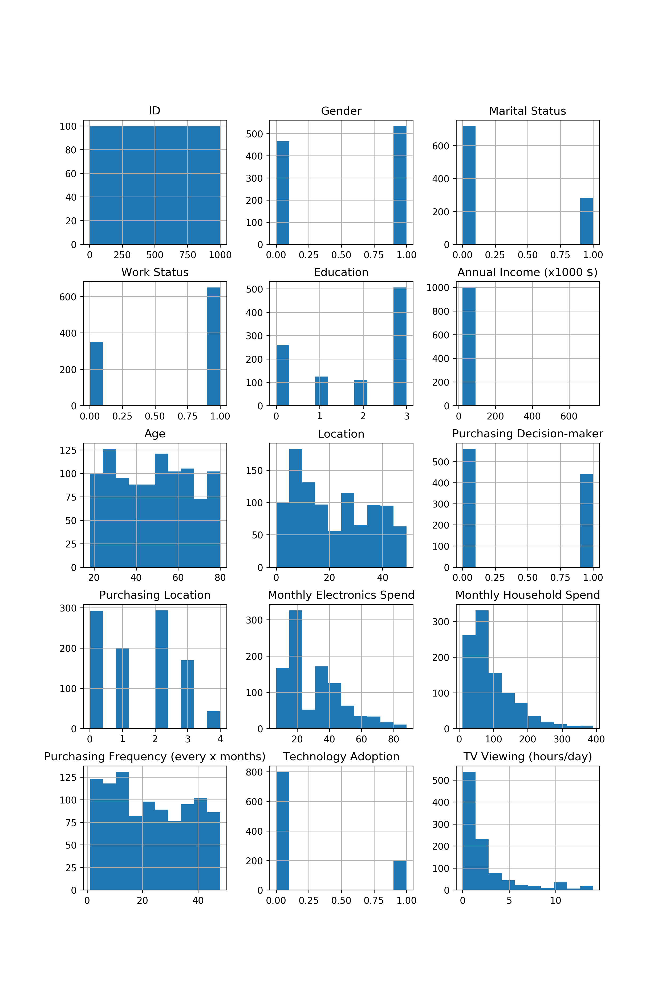

In [69]:
%matplotlib notebook
from itertools import combinations
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(dfE.columns)//3, 3, figsize=(10, 15))

i = 0
for triaxis in axes:
    for axis in triaxis:
        dfE.hist(column = dfE.columns[i], ax=axis)
        i = i+1

<IPython.core.display.Javascript object>


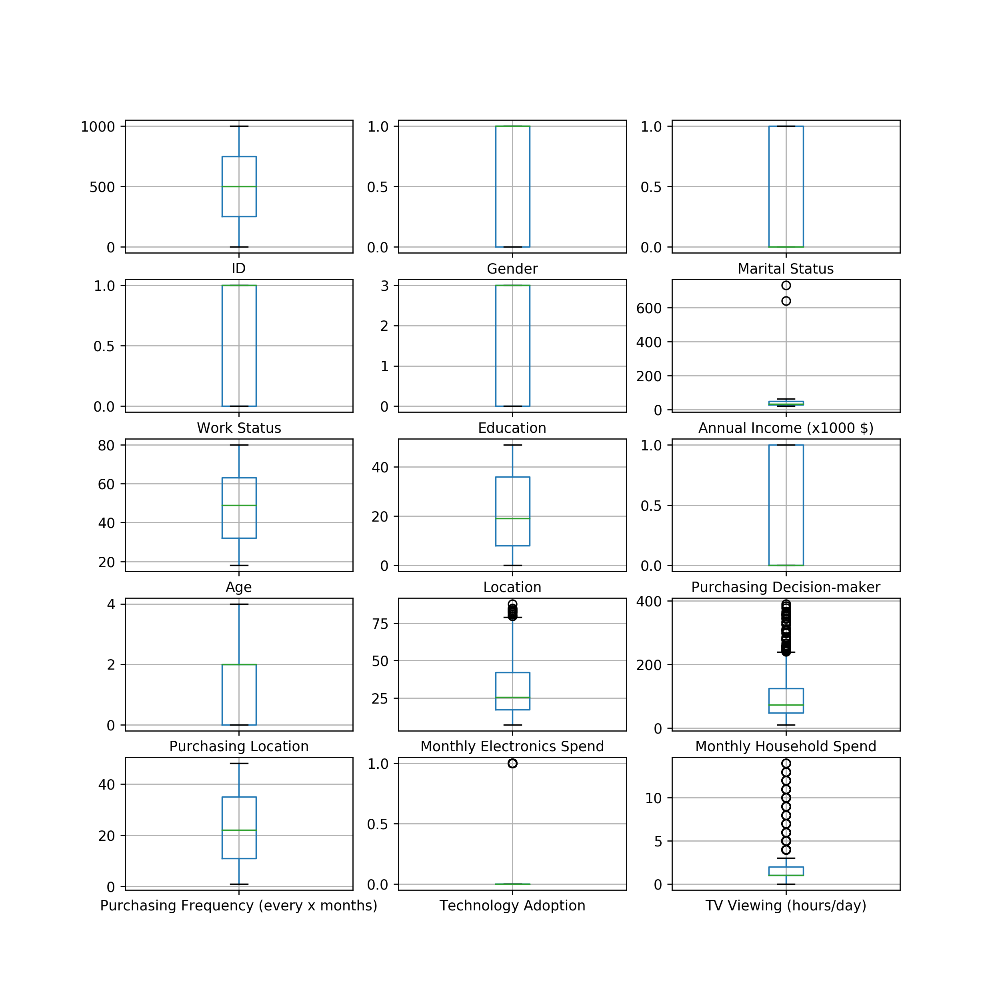

In [70]:
%matplotlib notebook
from itertools import combinations
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(dfE.columns)//3, 3, figsize=(10, 10))

i = 0
for triaxis in axes:
    for axis in triaxis:
        dfE.boxplot(column = dfE.columns[i], ax=axis)
        i = i+1

In [71]:
# remove outliers in annual income

dfE[dfE["Annual Income (x1000 $)"] >500]

dfET = dfE.drop(dfE.index[440])
dfET = dfET.drop(dfET.index[921])

dfT = df.drop(df.index[440])
dfT = dfT.drop(dfT.index[921])

In [72]:
dfET.describe()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
count,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000,998.000000
mean,500.136273,0.534068,0.280561,0.649299,1.862725,37.712425,48.280561,21.685371,0.440882,1.466934,30.903808,94.167335,23.016032,0.200401,2.371743,2.078156
std,288.792790,0.499088,0.449499,0.477429,1.284970,10.916500,17.826913,14.400045,0.496742,1.196957,17.015680,67.219733,13.873831,0.400501,2.912823,1.463670
min,1.000000,0.000000,0.000000,0.000000,0.000000,21.000000,18.000000,0.000000,0.000000,0.000000,7.000000,10.000000,1.000000,0.000000,0.000000,0.000000
25%,250.250000,0.000000,0.000000,0.000000,0.000000,29.000000,32.000000,8.000000,0.000000,0.000000,17.000000,47.000000,11.000000,0.000000,1.000000,1.000000
50%,500.500000,1.000000,0.000000,1.000000,3.000000,32.500000,49.000000,19.000000,0.000000,2.000000,25.000000,73.000000,22.000000,0.000000,1.000000,2.000000
75%,749.750000,1.000000,1.000000,1.000000,3.000000,48.000000,63.000000,36.000000,1.000000,2.000000,42.000000,123.750000,35.000000,0.000000,2.000000,3.000000
max,1000.000000,1.000000,1.000000,1.000000,3.000000,64.000000,80.000000,49.000000,1.000000,4.000000,88.000000,390.000000,48.000000,1.000000,14.000000,4.000000


In [73]:
corr = dfET.corr()**2
corr.style.background_gradient()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
ID,1,0.00291264,0.000838717,0.000224287,0.000541867,0.00141045,0.00193277,2.21222e-06,0.000159452,0.00136578,0.000849168,0.00307945,0.000709003,3.94468e-05,0.000105873,0.00319188
Gender,0.00291264,1,0.00266159,0.00141105,0.00232537,0.00656964,0.00731087,0.000108677,0.00163352,0.00500221,0.0136517,0.00560357,0.00774496,0.00413421,0.00298134,3.55538e-05
Marital Status,0.000838717,0.00266159,1,0.0352947,0.00197058,0.0286088,0.0730008,0.00486447,0.204025,0.0166702,0.00070125,0.000178208,0.000547546,0.0404813,0.000308066,0.0227257
Work Status,0.000224287,0.00141105,0.0352947,1,0.0438268,0.0355948,0.0231398,0.000416461,0.00737721,0.0802761,0.0871713,0.0514211,0.0285779,0.0245333,0.00348838,0.0165562
Education,0.000541867,0.00232537,0.00197058,0.0438268,1,0.178604,0.0122374,2.21868e-05,0.00871259,0.0857467,0.225086,0.113146,0.0169524,0.0199909,0.0373381,0.00579203
Annual Income (x1000 $),0.00141045,0.00656964,0.0286088,0.0355948,0.178604,1,0.0276701,2.82694e-05,0.156015,0.124032,0.678008,0.442462,0.0550432,0.226937,0.076504,0.00392032
Age,0.00193277,0.00731087,0.0730008,0.0231398,0.0122374,0.0276701,1,0.000758961,0.0493067,0.0165005,0.00262442,0.000212619,6.53808e-06,0.0215471,0.00122515,0.0229864
Location,2.21222e-06,0.000108677,0.00486447,0.000416461,2.21868e-05,2.82694e-05,0.000758961,1,0.0107795,0.00213278,0.000749686,0.00192278,0.000750039,0.00366453,0.000394181,9.29013e-05
Purchasing Decision-maker,0.000159452,0.00163352,0.204025,0.00737721,0.00871259,0.156015,0.0493067,0.0107795,1,1.84912e-05,0.0475023,0.028943,0.000670705,0.118143,0.0176345,0.0145336
Purchasing Location,0.00136578,0.00500221,0.0166702,0.0802761,0.0857467,0.124032,0.0165005,0.00213278,1.84912e-05,1,0.226445,0.134809,0.0755724,0.0381782,0.00897077,0.0010807


### Factors that can be eliminated (can be explained by another)

Monthly Household Spend (approximated by Monthly Electronics Spend)


Annual Income (approximated by Monthly Electronics Spend)


TV Viewing (approsimated by Tech Adoption)

In [74]:
# i left tv viewing in just cause its an important var and i want to see it later

dfTx = dfT.drop(columns=["Monthly Household Spend", "Annual Income (x1000 $)"])
dfETx = dfET.drop(columns=["Monthly Household Spend", "Annual Income (x1000 $)"])
dfETx.head()

,ID,Gender,Marital Status,Work Status,Education,Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,1,0,1,3,30.0,8,0,1,35.0,13.0,1,2.0,2
1,2.0,1,1,0,3,36.0,0,1,1,35.0,26.0,1,10.0,2
2,3.0,1,0,1,0,66.0,20,0,3,64.0,13.0,0,0.0,4
3,4.0,1,0,0,2,78.0,31,0,1,33.0,22.0,1,5.0,2
4,5.0,0,1,0,3,52.0,25,1,1,45.0,47.0,1,2.0,2


<IPython.core.display.Javascript object>


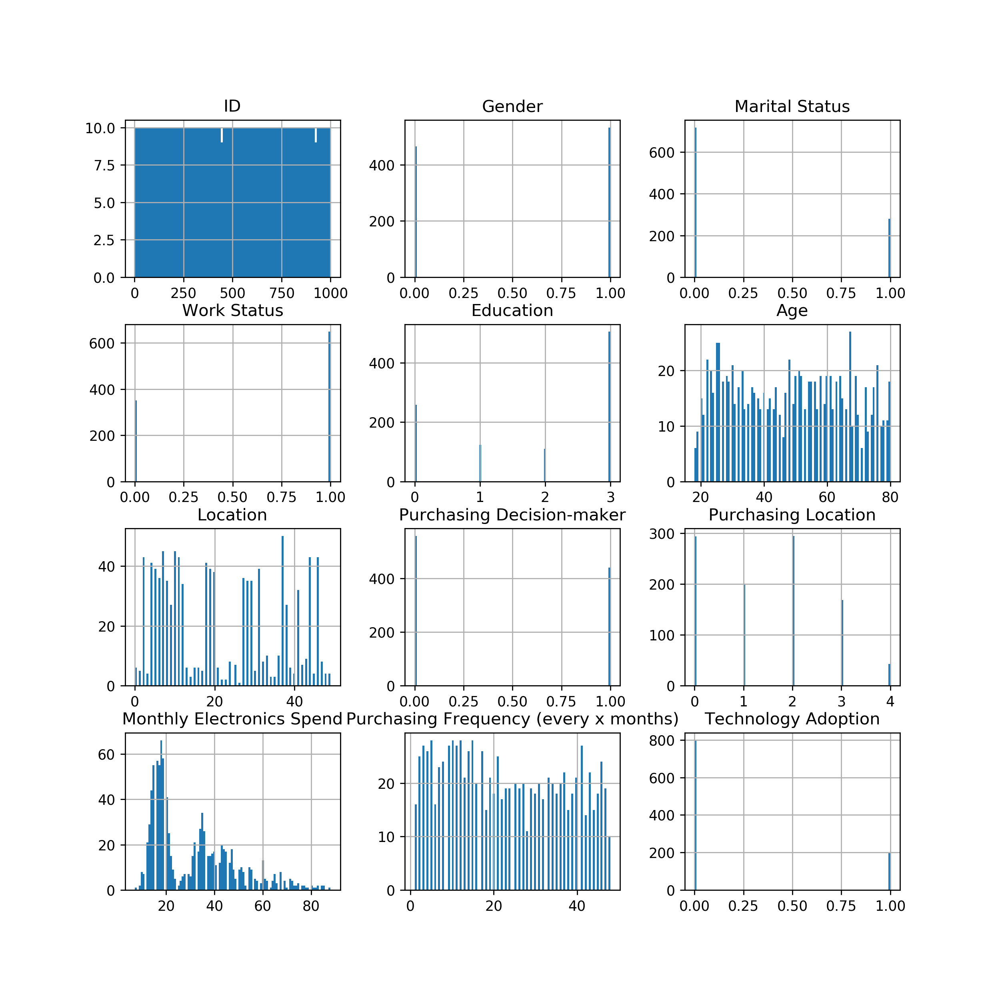

In [75]:
%matplotlib notebook
from itertools import combinations
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(dfETx.columns)//3, 3, figsize=(10, 10))

i = 0
for triaxis in axes:
    for axis in triaxis:
        dfETx.hist(column = dfETx.columns[i], bins = 100, ax=axis)
        i = i+1

<IPython.core.display.Javascript object>


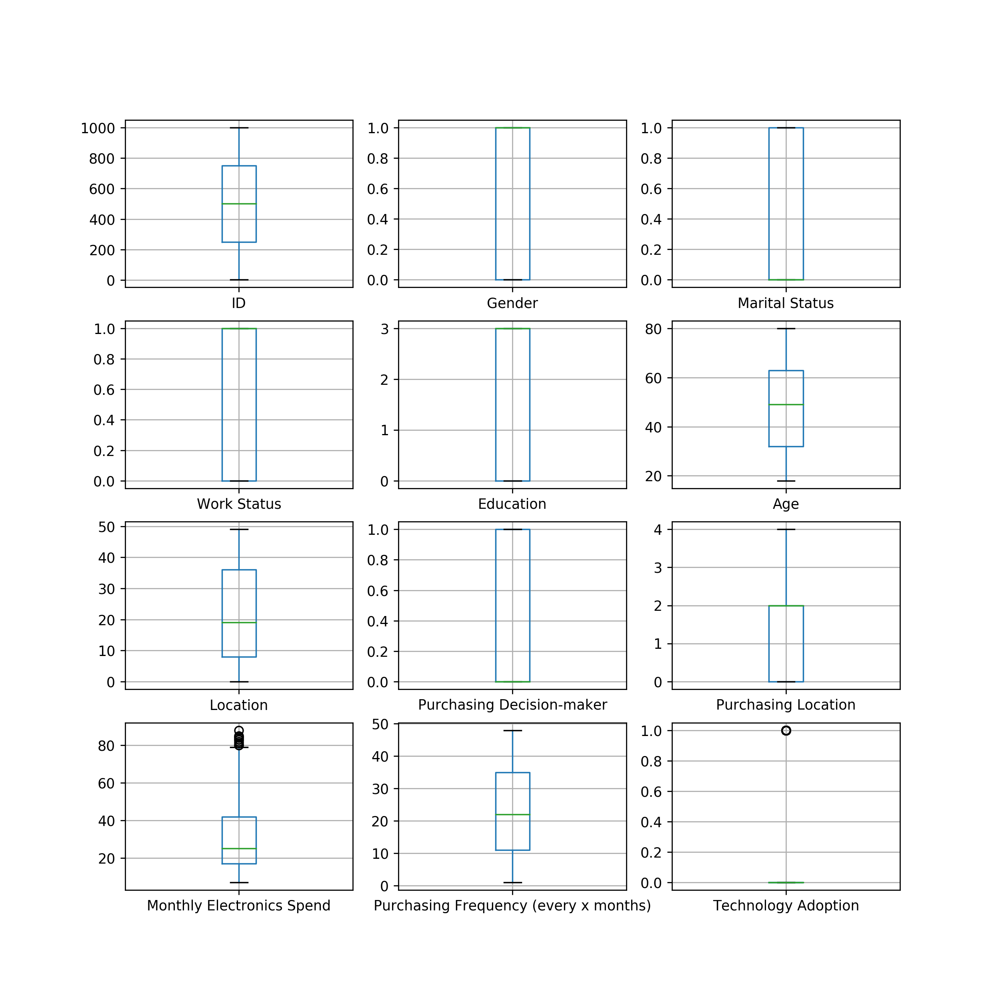

In [76]:
%matplotlib notebook
from itertools import combinations
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(dfETx.columns)//3, 3, figsize=(10, 10))

i = 0
for triaxis in axes:
    for axis in triaxis:
        dfETx.boxplot(column = dfETx.columns[i], ax=axis)
        i = i+1

### Understanding Factors
- monthly electronics/household spend has a few high spending outliers clustered together (right skew)
- TV viewing also has a few high watching outliers


*intersts: perhaps the outliers across these 2 factors are related?*

### simplifying through similar groups

In [77]:
# discount and retail
discNRet = dfTx.loc[(dfTx["Purchasing Location"] == "discount") | (dfTx["Purchasing Location"] == "retail")]
discNRet.head()

,ID,Gender,Marital Status,Work Status,Education,Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
5,6.0,female,married,none,BA,72.0,New Jersey,single,retail,14.0,32.0,early,1.0,time shifting
6,7.0,male,married,professional,none,62.0,California,single,discount,18.0,41.0,early,0.0,cool gadget
7,8.0,male,married,none,none,30.0,New Hampshire,single,retail,23.0,9.0,early,1.0,schedule control
9,10.0,female,married,professional,none,59.0,Idaho,family,discount,16.0,25.0,early,0.0,schedule control
10,11.0,female,single,professional,PhD,25.0,Florida,single,discount,38.0,2.0,early,6.0,programming/interactive features


<IPython.core.display.Javascript object>


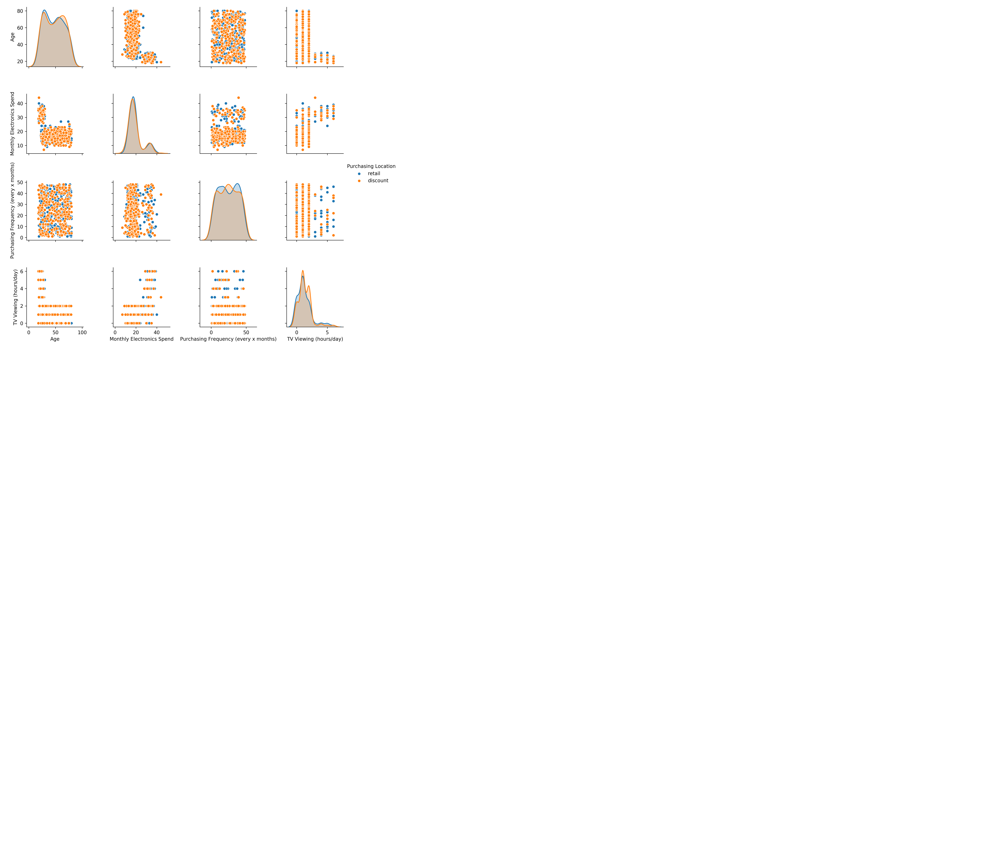

<IPython.core.display.Javascript object>


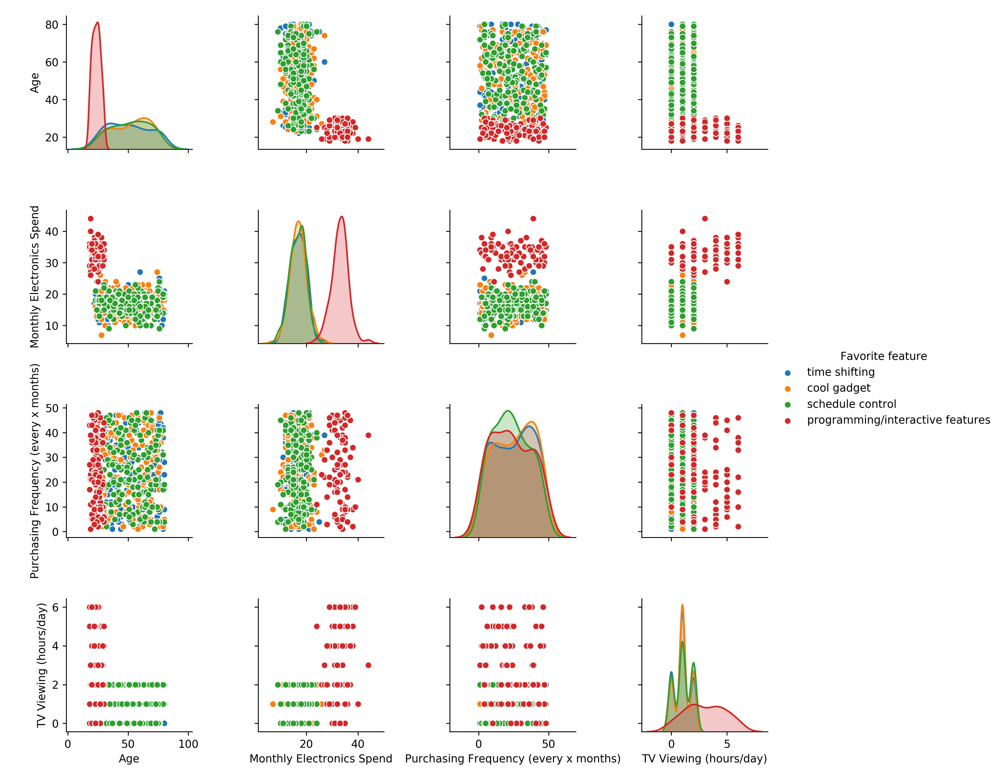

In [78]:
sns.pairplot(discNRet.loc[:, discNRet.columns != 'ID'],hue = "Purchasing Location")
sns.pairplot(discNRet.loc[:, discNRet.columns != 'ID'],hue = "Favorite feature")

In [79]:
# cool gadget, schedule control, time shifting

coolT = dfTx.loc[(dfTx["Favorite feature"] == "cool gadget") | (dfTx["Favorite feature"] == "schedule control") | (dfTx["Favorite feature"] == "time shifting")]
coolT.head()

,ID,Gender,Marital Status,Work Status,Education,Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
2,3.0,male,married,professional,BA,66.0,Massachusetts,family,specialty stores,64.0,13.0,early,0.0,time shifting
5,6.0,female,married,none,BA,72.0,New Jersey,single,retail,14.0,32.0,early,1.0,time shifting
6,7.0,male,married,professional,none,62.0,California,single,discount,18.0,41.0,early,0.0,cool gadget
7,8.0,male,married,none,none,30.0,New Hampshire,single,retail,23.0,9.0,early,1.0,schedule control
8,9.0,male,married,professional,none,60.0,Massachusetts,family,specialty stores,74.0,1.0,early,0.0,schedule control


<IPython.core.display.Javascript object>


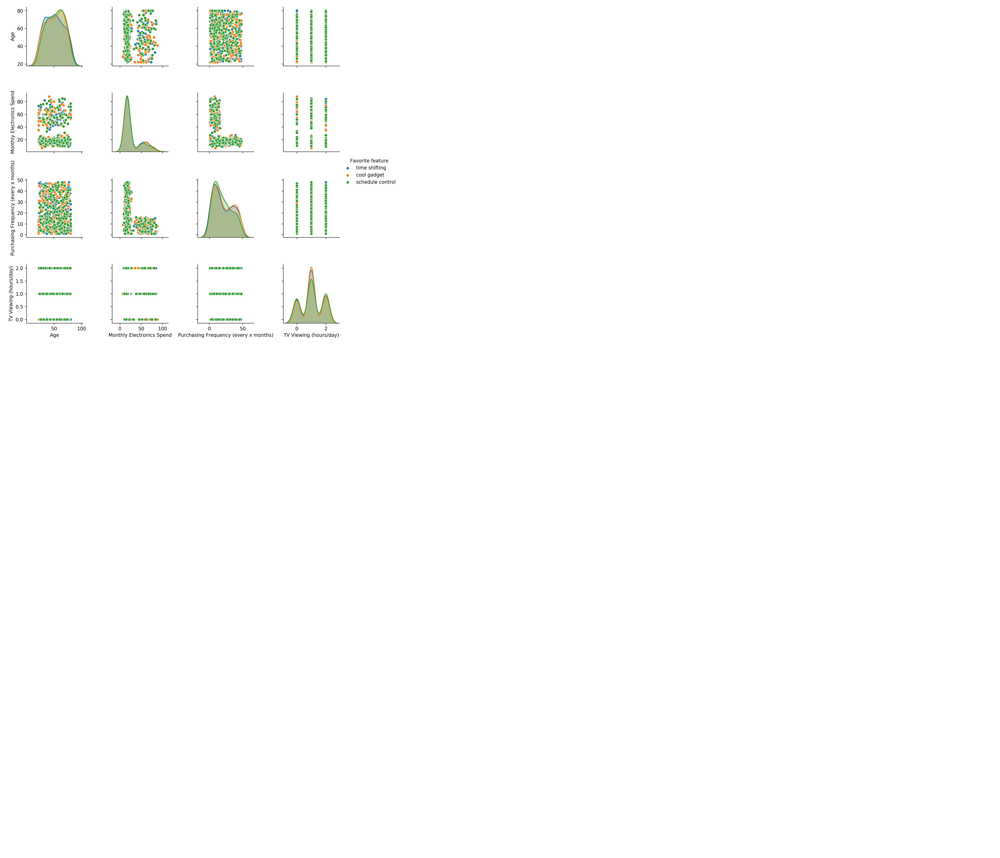

<IPython.core.display.Javascript object>


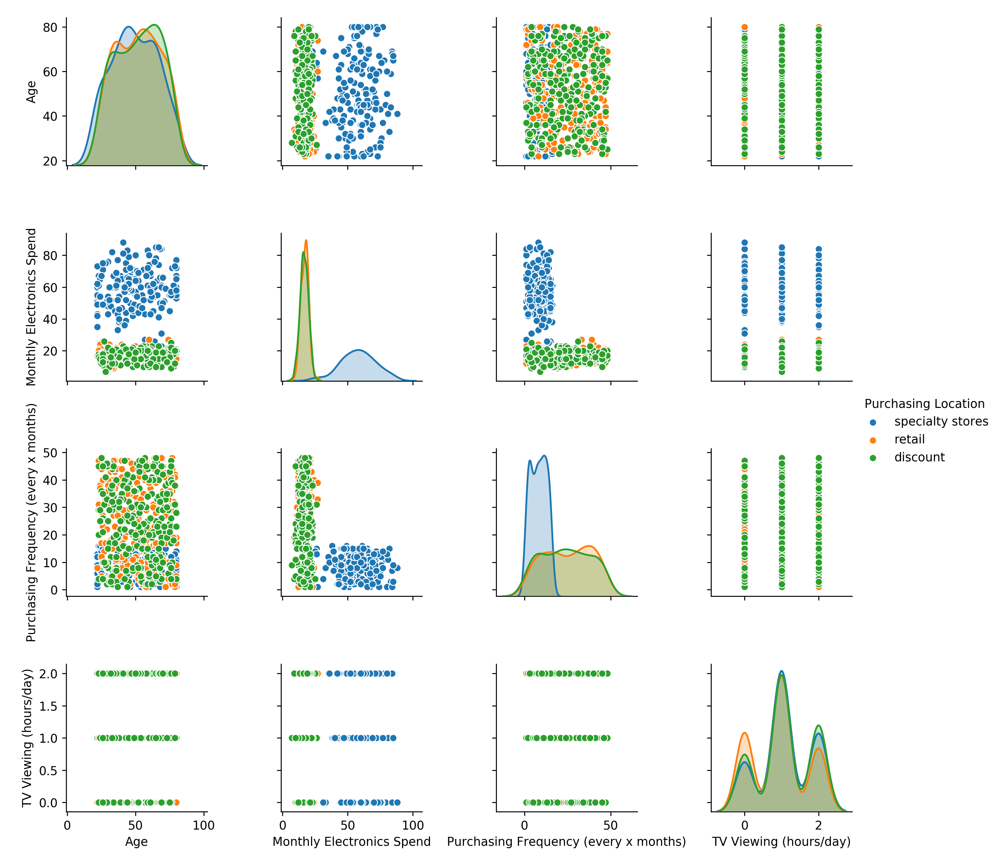

In [80]:
sns.pairplot(coolT.loc[:, coolT.columns != 'ID'],hue = "Favorite feature")
sns.pairplot(coolT.loc[:, coolT.columns != 'ID'],hue = "Purchasing Location")

In [81]:
dfETx.head()

,ID,Gender,Marital Status,Work Status,Education,Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,1,0,1,3,30.0,8,0,1,35.0,13.0,1,2.0,2
1,2.0,1,1,0,3,36.0,0,1,1,35.0,26.0,1,10.0,2
2,3.0,1,0,1,0,66.0,20,0,3,64.0,13.0,0,0.0,4
3,4.0,1,0,0,2,78.0,31,0,1,33.0,22.0,1,5.0,2
4,5.0,0,1,0,3,52.0,25,1,1,45.0,47.0,1,2.0,2


In [82]:
### cleaning up the dataframe 
dfSimplified = dfTx.copy()
# by disc = retail
dfSimplified = dfSimplified.replace("retail", "discount & retail")
dfSimplified = dfSimplified.replace("discount", "discount & retail")


# by cool gadget = schedule control = time shifting
dfSimplified = dfSimplified.replace("cool gadget", "timing control")
dfSimplified = dfSimplified.replace("time shifting", "timing control")
dfSimplified = dfSimplified.replace("schedule control", "timing control")
dfSimplified.head(20)

### cleaning up the dataframe 
dfESimplified = dfETx.copy()
# by disc = retail
dfESimplified = dfESimplified.replace("retail", "discount & retail")
dfESimplified = dfESimplified.replace("discount", "discount & retail")


# by cool gadget = schedule control = time shifting
dfESimplified = dfESimplified.replace("cool gadget", "timing control")
dfESimplified = dfESimplified.replace("time shifting", "timing control")
dfESimplified = dfESimplified.replace("schedule control", "timing control")
dfESimplified.head(20)

,ID,Gender,Marital Status,Work Status,Education,Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,1,0,1,3,30.0,8,0,1,35.0,13.0,1,2.0,2
1,2.0,1,1,0,3,36.0,0,1,1,35.0,26.0,1,10.0,2
2,3.0,1,0,1,0,66.0,20,0,3,64.0,13.0,0,0.0,4
3,4.0,1,0,0,2,78.0,31,0,1,33.0,22.0,1,5.0,2
4,5.0,0,1,0,3,52.0,25,1,1,45.0,47.0,1,2.0,2
5,6.0,0,0,0,0,72.0,29,1,2,14.0,32.0,0,1.0,4
6,7.0,1,0,1,3,62.0,4,1,0,18.0,41.0,0,0.0,0
7,8.0,1,0,0,3,30.0,28,1,2,23.0,9.0,0,1.0,3
8,9.0,1,0,1,3,60.0,20,0,3,74.0,1.0,0,0.0,3
9,10.0,0,0,1,3,59.0,11,0,0,16.0,25.0,0,0.0,3


# Looking for meaningful segments 
## (differentiated by consumer need; actionable by being uniquely accessible)

In [83]:
dfESimplified.head()

,ID,Gender,Marital Status,Work Status,Education,Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,1,0,1,3,30.0,8,0,1,35.0,13.0,1,2.0,2
1,2.0,1,1,0,3,36.0,0,1,1,35.0,26.0,1,10.0,2
2,3.0,1,0,1,0,66.0,20,0,3,64.0,13.0,0,0.0,4
3,4.0,1,0,0,2,78.0,31,0,1,33.0,22.0,1,5.0,2
4,5.0,0,1,0,3,52.0,25,1,1,45.0,47.0,1,2.0,2


In [84]:
sns.pairplot(dfESimplified.loc[:, dfESimplified.columns != 'ID'],hue = "Favorite feature")


<IPython.core.display.Javascript object>

LinAlgError: singular matrix

<IPython.core.display.Javascript object>


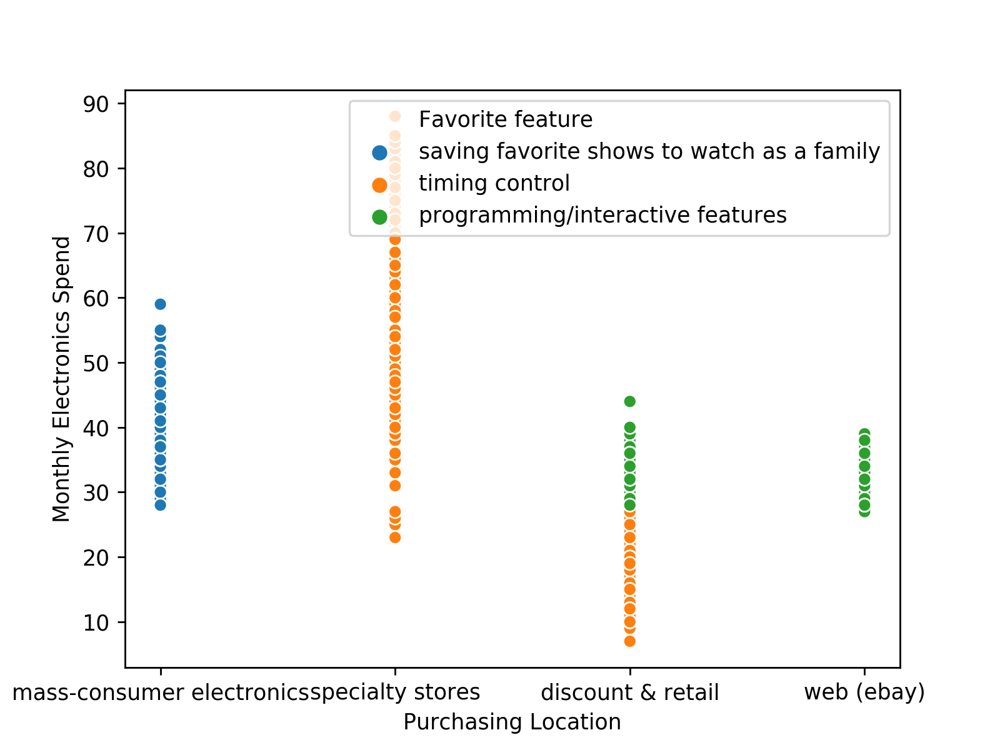

In [85]:
#sns.pairplot(dfESimplified.loc[:, dfESimplified.columns != 'ID'],hue = "Favorite feature")
%matplotlib notebook
sns.scatterplot(x="Purchasing Location", y="Monthly Electronics Spend", hue ="Favorite feature",data = dfSimplified)
plt.show()

# Segmenting by Purchasing Location and TV Viewing

In [86]:
# mass consumer
s1= dfSimplified.loc[(dfSimplified["Purchasing Location"] == "mass-consumer electronics")]
s2= dfSimplified.loc[(dfSimplified["Purchasing Location"] == "discount & retail") & (dfSimplified["Monthly Electronics Spend"] <= 26)]
s3= dfSimplified.loc[(dfSimplified["Purchasing Location"] == "discount & retail") & (dfSimplified["Monthly Electronics Spend"] > 26)]
s4= dfSimplified.loc[(dfSimplified["Purchasing Location"] == "specialty stores")]
s5= dfSimplified.loc[(dfSimplified["Purchasing Location"] == "web (ebay)")]


In [87]:
# summary of segments

print("S1: MASS CONSUMER ELECTRONICS")
print("MARKET SIZE: ",round(len(s1)/len(dfSimplified), 2))
print("MOST APPEALING FEATURE: ")
print("     ", s1["Favorite feature"].value_counts()/len(s1))
print("MONTHLY ELECTRONICS SPEND: ", round(s1["Monthly Electronics Spend"].mean(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s1["Technology Adoption"].value_counts()/len(s1))
print("TV VIEWING: ", round(s1["TV Viewing (hours/day)"].mean(),2))

print("______________")

print("S2: disc/ ret and low")
print("MARKET SIZE: ",round(len(s2)/len(dfSimplified), 2))
print("MOST APPEALING FEATURE: ")
print("     ", s2["Favorite feature"].value_counts()/len(s2))
print("MONTHLY ELECTRONICS SPEND: ", round(s2["Monthly Electronics Spend"].mean(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s2["Technology Adoption"].value_counts()/len(s2))
print("TV VIEWING: ", round(s2["TV Viewing (hours/day)"].mean(),2))

print("______________")

print("S3: disc/ ret and high")
print("MARKET SIZE: ",round(len(s3)/len(dfSimplified), 2))
print("MOST APPEALING FEATURE: ")
print("     ", s3["Favorite feature"].value_counts()/len(s3))
print("MONTHLY ELECTRONICS SPEND: ", round(s3["Monthly Electronics Spend"].mean(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s3["Technology Adoption"].value_counts()/len(s3))
print("TV VIEWING: ", round(s3["TV Viewing (hours/day)"].mean(),2))

print("______________")

print("S4: SPECIALTY")
print("MARKET SIZE: ",round(len(s4)/len(dfSimplified), 2))
print("MOST APPEALING FEATURE: ")
print("     ", s4["Favorite feature"].value_counts()/len(s4))
print("MONTHLY ELECTRONICS SPEND: ", round(s4["Monthly Electronics Spend"].mean(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s4["Technology Adoption"].value_counts()/len(s4))
print("TV VIEWING: ", round(s4["TV Viewing (hours/day)"].mean(),2))

print("______________")

print("S5: WEB (EBAY)")
print("MARKET SIZE: ",round(len(s5)/len(dfSimplified), 2))
print("MOST APPEALING FEATURE: ")
print("     ", s5["Favorite feature"].value_counts()/len(s5))
print("MONTHLY ELECTRONICS SPEND: ", round(s5["Monthly Electronics Spend"].mean(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s5["Technology Adoption"].value_counts()/len(s5))
print("TV VIEWING: ", round(s5["TV Viewing (hours/day)"].mean(),2))

print("______________")

S1: MASS CONSUMER ELECTRONICS
MARKET SIZE:  0.2
MOST APPEALING FEATURE: 
      saving favorite shows to watch as a family    1.0
Name: Favorite feature, dtype: float64
MONTHLY ELECTRONICS SPEND:  41.4
TECHNOLOGY ADOPTION: 
      late    1.0
Name: Technology Adoption, dtype: float64
TV VIEWING:  6.32
______________
S2: disc/ ret and low
MARKET SIZE:  0.5
MOST APPEALING FEATURE: 
      timing control                      0.996
programming/interactive features    0.004
Name: Favorite feature, dtype: float64
MONTHLY ELECTRONICS SPEND:  16.89
TECHNOLOGY ADOPTION: 
      early    1.0
Name: Technology Adoption, dtype: float64
TV VIEWING:  1.03
______________
S3: disc/ ret and high
MARKET SIZE:  0.09
MOST APPEALING FEATURE: 
      programming/interactive features    0.977011
timing control                      0.022989
Name: Favorite feature, dtype: float64
MONTHLY ELECTRONICS SPEND:  33.11
TECHNOLOGY ADOPTION: 
      early    1.0
Name: Technology Adoption, dtype: float64
TV VIEWING:  3.0
____

In [22]:
# homogeneity of segments

print("S1: MASS CONSUMER ELECTRONICS")
print("MOST APPEALING FEATURE: ")
print("     ", s1["Favorite feature"].value_counts()/len(s1))
print("MONTHLY ELECTRONICS SPEND: ", round(s1["Monthly Electronics Spend"].std(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s1["Technology Adoption"].value_counts()/len(s1))
print("TV VIEWING: ", round(s1["TV Viewing (hours/day)"].std(),2))

print("______________")

print("S2: disc/ ret and low")
print("MOST APPEALING FEATURE: ")
print("     ", s2["Favorite feature"].value_counts()/len(s2))
print("MONTHLY ELECTRONICS SPEND: ", round(s2["Monthly Electronics Spend"].std(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s2["Technology Adoption"].value_counts()/len(s2))
print("TV VIEWING: ", round(s2["TV Viewing (hours/day)"].std(),2))

print("______________")

print("S3: disc/ ret and high")
print("MOST APPEALING FEATURE: ")
print("     ", s3["Favorite feature"].value_counts()/len(s3))
print("MONTHLY ELECTRONICS SPEND: ", round(s3["Monthly Electronics Spend"].std(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s3["Technology Adoption"].value_counts()/len(s3))
print("TV VIEWING: ", round(s3["TV Viewing (hours/day)"].std(),2))

print("______________")

print("S4: SPECIALTY")
print("MOST APPEALING FEATURE: ")
print("     ", s4["Favorite feature"].value_counts()/len(s4))
print("MONTHLY ELECTRONICS SPEND: ", round(s4["Monthly Electronics Spend"].std(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s4["Technology Adoption"].value_counts()/len(s4))
print("TV VIEWING: ", round(s4["TV Viewing (hours/day)"].std(),2))

print("______________")

print("S5: WEB (EBAY)")
print("MOST APPEALING FEATURE: ")
print("     ", s5["Favorite feature"].value_counts()/len(s5))
print("MONTHLY ELECTRONICS SPEND: ", round(s5["Monthly Electronics Spend"].std(),2))
print("TECHNOLOGY ADOPTION: ")
print("     ", s5["Technology Adoption"].value_counts()/len(s5))
print("TV VIEWING: ", round(s5["TV Viewing (hours/day)"].std(),2))

print("______________")

S1: MASS CONSUMER ELECTRONICS
MOST APPEALING FEATURE: 
      saving favorite shows to watch as a family    1.0
Name: Favorite feature, dtype: float64
MONTHLY ELECTRONICS SPEND:  5.61
TECHNOLOGY ADOPTION: 
      late    1.0
Name: Technology Adoption, dtype: float64
TV VIEWING:  4.1
______________
S2: disc/ ret and low
MOST APPEALING FEATURE: 
      timing control                      0.996
programming/interactive features    0.004
Name: Favorite feature, dtype: float64
MONTHLY ELECTRONICS SPEND:  3.08
TECHNOLOGY ADOPTION: 
      early    1.0
Name: Technology Adoption, dtype: float64
TV VIEWING:  0.74
______________
S3: disc/ ret and high
MOST APPEALING FEATURE: 
      programming/interactive features    0.977011
timing control                      0.022989
Name: Favorite feature, dtype: float64
MONTHLY ELECTRONICS SPEND:  3.07
TECHNOLOGY ADOPTION: 
      early    1.0
Name: Technology Adoption, dtype: float64
TV VIEWING:  1.77
______________
S4: SPECIALTY
MOST APPEALING FEATURE: 
      t

count    168.000000
mean      58.279762
std       13.319171
min       23.000000
25%       49.000000
50%       59.000000
75%       67.000000
max       88.000000
Name: Monthly Electronics Spend, dtype: float64


Text(85,0.028,'std: 13.32')

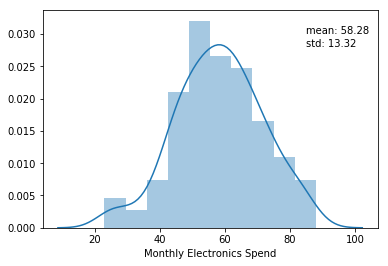

In [88]:
# s4
%matplotlib inline

print(s4["Monthly Electronics Spend"].describe())
sns.distplot(s4["Monthly Electronics Spend"])
plt.text(85,0.03,"mean: 58.28")
plt.text(85,0.028,"std: 13.32")

### Exploring Demographics of my segments

female    0.53
male      0.47
Name: Gender, dtype: float64
married    0.9
single     0.1
Name: Marital Status, dtype: float64
none            0.5
professional    0.5
Name: Work Status, dtype: float64
PhD     0.25
none    0.25
MA      0.25
BA      0.25
Name: Education, dtype: float64
family    0.9
single    0.1
Name: Purchasing Decision-maker, dtype: float64


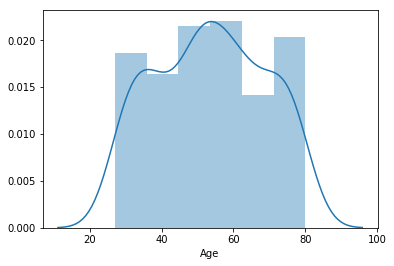

In [99]:
#s1

print(s1["Gender"].value_counts()/len(s1))
print(s1["Marital Status"].value_counts()/len(s1))
print(s1["Work Status"].value_counts()/len(s1))
print(s1["Education"].value_counts()/len(s1))
print(s1["Purchasing Decision-maker"].value_counts()/len(s1))

sns.distplot(s1["Age"])

male      0.514
female    0.486
Name: Gender, dtype: float64
married    0.796
single     0.204
Name: Marital Status, dtype: float64
professional    0.502
none            0.498
Name: Work Status, dtype: float64
none    0.798
BA      0.152
MA      0.030
PhD     0.020
Name: Education, dtype: float64
single    0.5
family    0.5
Name: Purchasing Decision-maker, dtype: float64


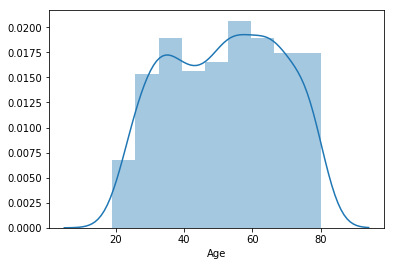

In [100]:
#s2

print(s2["Gender"].value_counts()/len(s2))
print(s2["Marital Status"].value_counts()/len(s2))
print(s2["Work Status"].value_counts()/len(s2))
print(s2["Education"].value_counts()/len(s2))
print(s2["Purchasing Decision-maker"].value_counts()/len(s2))

sns.distplot(s2["Age"])

male      0.505747
female    0.494253
Name: Gender, dtype: float64
single     0.896552
married    0.103448
Name: Marital Status, dtype: float64
professional    0.988506
none            0.011494
Name: Work Status, dtype: float64
PhD     0.287356
none    0.241379
BA      0.241379
MA      0.229885
Name: Education, dtype: float64
single    1.0
Name: Purchasing Decision-maker, dtype: float64


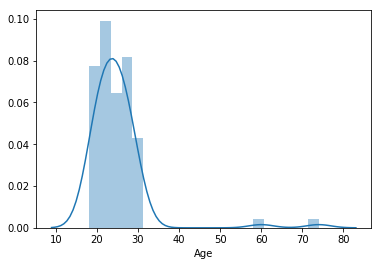

In [101]:
#s3

print(s3["Gender"].value_counts()/len(s3))
print(s3["Marital Status"].value_counts()/len(s3))
print(s3["Work Status"].value_counts()/len(s3))
print(s3["Education"].value_counts()/len(s3))
print(s3["Purchasing Decision-maker"].value_counts()/len(s3))

sns.distplot(s3["Age"])

male      0.702381
female    0.297619
Name: Gender, dtype: float64
married    0.761905
single     0.238095
Name: Marital Status, dtype: float64
professional    1.0
Name: Work Status, dtype: float64
BA      0.601190
MA      0.154762
none    0.142857
PhD     0.101190
Name: Education, dtype: float64
family    0.761905
single    0.238095
Name: Purchasing Decision-maker, dtype: float64


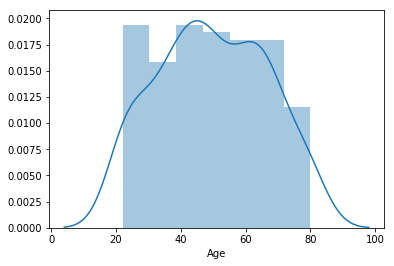

In [102]:
#s4

print(s4["Gender"].value_counts()/len(s4))
print(s4["Marital Status"].value_counts()/len(s4))
print(s4["Work Status"].value_counts()/len(s4))
print(s4["Education"].value_counts()/len(s4))
print(s4["Purchasing Decision-maker"].value_counts()/len(s4))

sns.distplot(s4["Age"])

female    0.534884
male      0.465116
Name: Gender, dtype: float64
single     0.930233
married    0.069767
Name: Marital Status, dtype: float64
professional    1.0
Name: Work Status, dtype: float64
MA      0.302326
none    0.255814
BA      0.255814
PhD     0.186047
Name: Education, dtype: float64
single    1.0
Name: Purchasing Decision-maker, dtype: float64


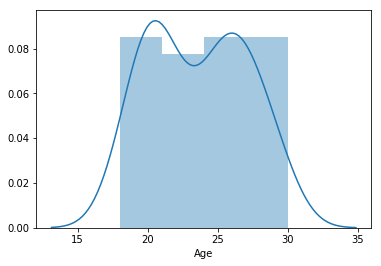

In [103]:
#s5

print(s5["Gender"].value_counts()/len(s5))
print(s5["Marital Status"].value_counts()/len(s5))
print(s5["Work Status"].value_counts()/len(s5))
print(s5["Education"].value_counts()/len(s5))
print(s5["Purchasing Decision-maker"].value_counts()/len(s5))

sns.distplot(s5["Age"])